In [3]:
import torch
from BaseUnet import UNet
from config import *
import os
import numpy as np
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
masks_dir = train_masks
all_colors = set()
for mask_name in os.listdir(masks_dir):
    mask = Image.open(os.path.join(masks_dir, mask_name)).convert("RGB")
    colors = np.array(mask).reshape(-1, 3)
    unique_colors = set(tuple(c) for c in colors)
    all_colors.update(unique_colors)

class_colors = sorted(list(all_colors))
print(f"Классы: {class_colors}")

Классы: [(np.uint8(0), np.uint8(0), np.uint8(0)), (np.uint8(0), np.uint8(0), np.uint8(70)), (np.uint8(0), np.uint8(0), np.uint8(110)), (np.uint8(0), np.uint8(0), np.uint8(142)), (np.uint8(0), np.uint8(0), np.uint8(230)), (np.uint8(0), np.uint8(60), np.uint8(100)), (np.uint8(0), np.uint8(80), np.uint8(100)), (np.uint8(20), np.uint8(20), np.uint8(20)), (np.uint8(70), np.uint8(70), np.uint8(70)), (np.uint8(70), np.uint8(130), np.uint8(180)), (np.uint8(81), np.uint8(0), np.uint8(81)), (np.uint8(102), np.uint8(102), np.uint8(156)), (np.uint8(107), np.uint8(142), np.uint8(35)), (np.uint8(111), np.uint8(74), np.uint8(0)), (np.uint8(128), np.uint8(64), np.uint8(128)), (np.uint8(150), np.uint8(100), np.uint8(100)), (np.uint8(150), np.uint8(120), np.uint8(90)), (np.uint8(152), np.uint8(251), np.uint8(152)), (np.uint8(153), np.uint8(153), np.uint8(153)), (np.uint8(180), np.uint8(165), np.uint8(180)), (np.uint8(190), np.uint8(153), np.uint8(153)), (np.uint8(220), np.uint8(20), np.uint8(60)), (np.u

In [5]:
len(class_colors)

26

In [8]:
test_model = UNet(num_classes=num_classes)
checkpoint = torch.load('best_model_v2_50.pth')
test_model.load_state_dict(checkpoint['model_state_dict'])
test_model.to(device)

UNet(
  (down1): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down2): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=

In [9]:
from data import SegmentationDataset
from torch.utils.data import DataLoader
from transforms import *

In [10]:
test_dataset = SegmentationDataset(test_images, test_masks, class_colors, val_transform)

test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [12]:
def decode_segmap(mask_indices, class_colors):
    """Преобразуем индекс маски обратно в RGB цвета для отображения"""
    h, w = mask_indices.shape
    mask_rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for idx, color in enumerate(class_colors):
        mask_rgb[mask_indices == idx] = color
    return mask_rgb

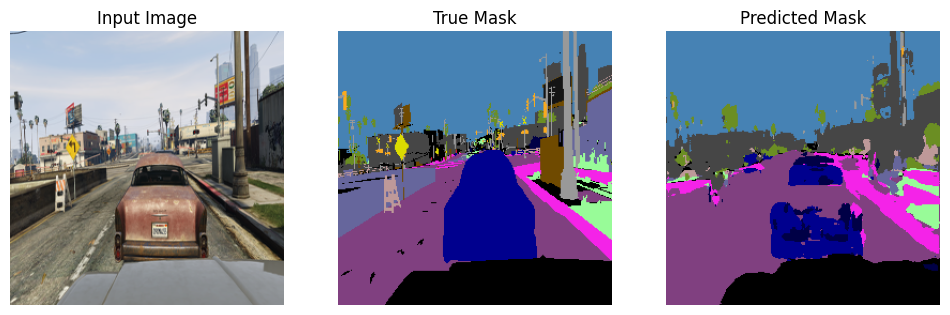

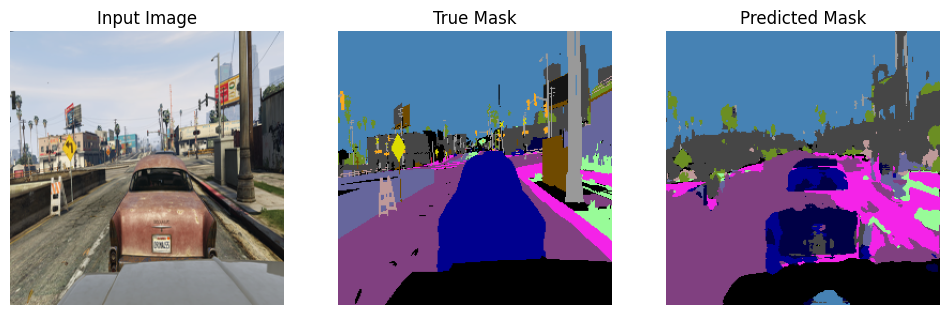

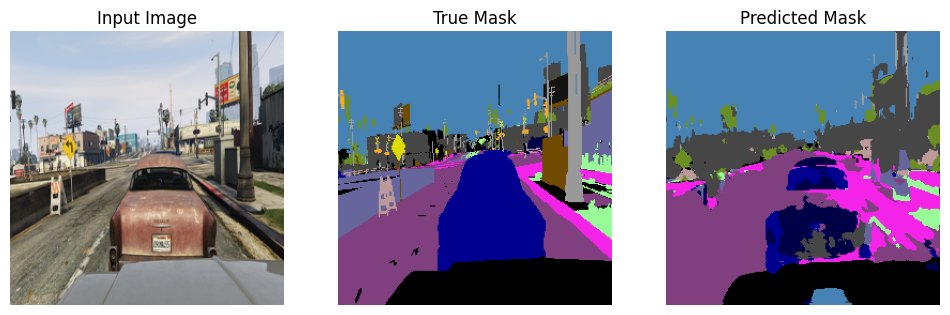

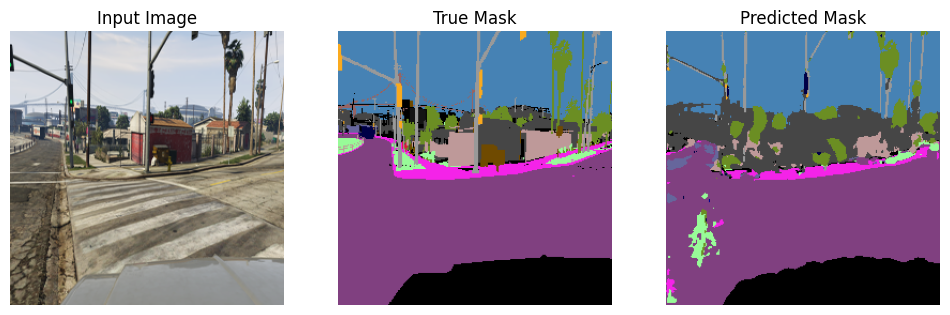

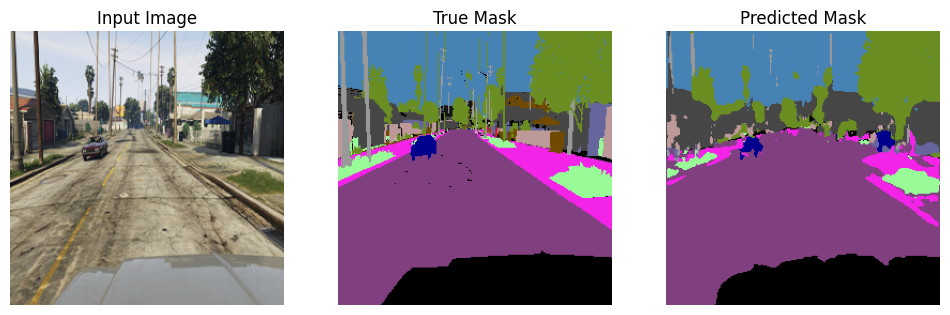

...

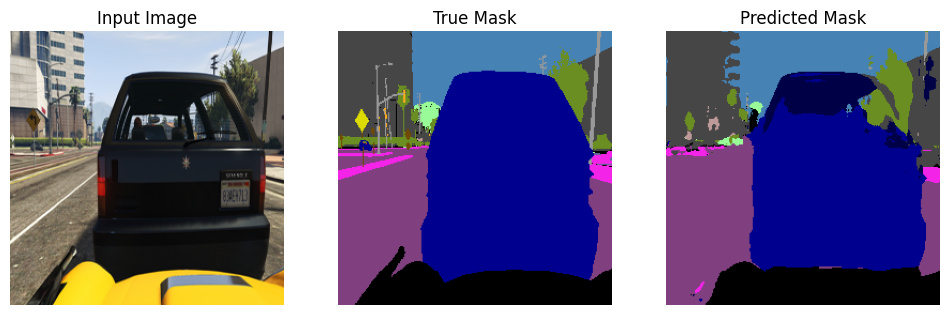

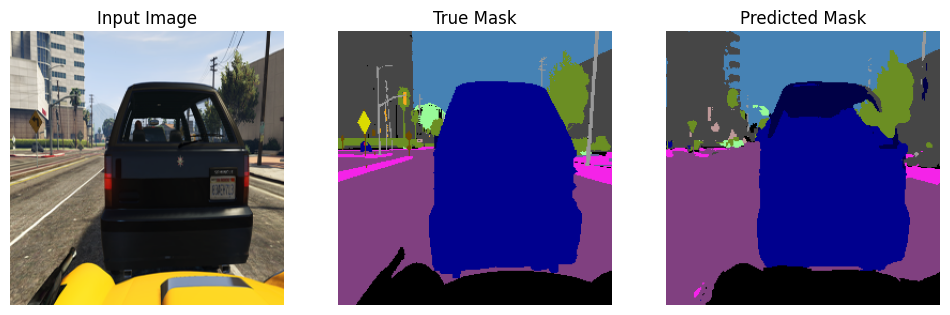

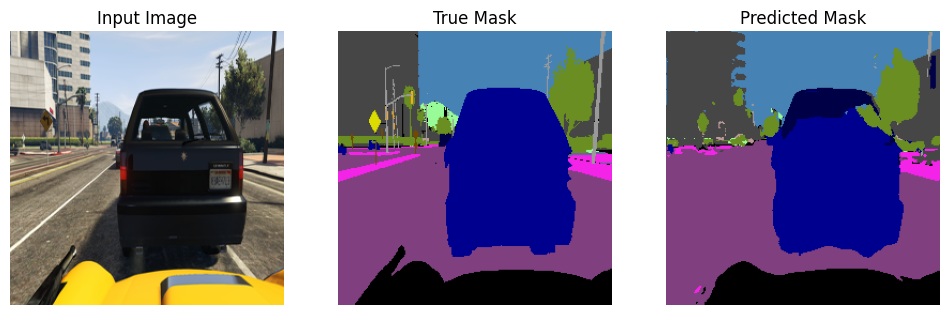

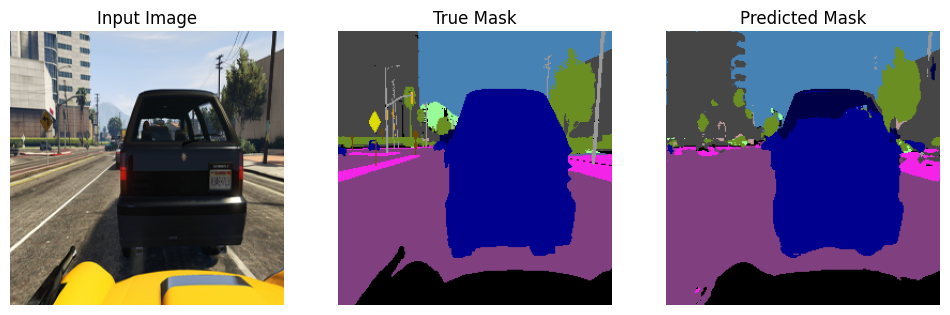

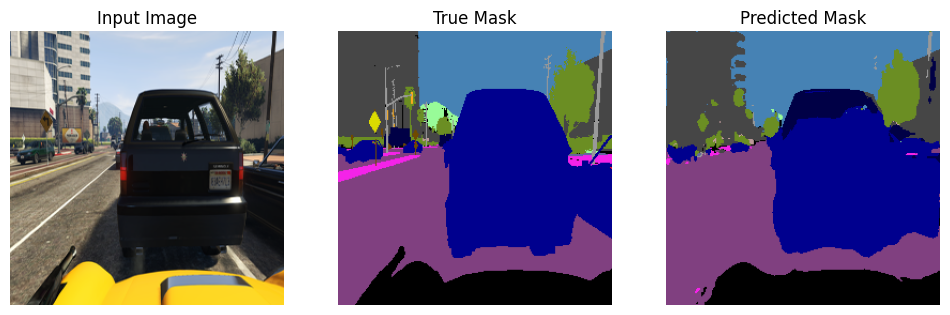

In [20]:
import matplotlib.pyplot as plt
import random
import torch
import numpy as np
# Количество изображений для визуализации
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

with torch.no_grad():
    for i, (image, true_mask) in enumerate(test_loader):
        image = image.to(device)

        output = test_model(image)  # [B, num_classes, H, W]
        pred = torch.argmax(output, dim=1)  # [B, H, W]

        for b in range(image.size(0)):  # цикл по батчу
            pred_mask = pred[b].cpu().numpy()  # (H, W)
            pred_mask_rgb = decode_segmap(pred_mask, class_colors)

            # Обратное преобразование изображения
            img_np = image[b].permute(1, 2, 0).cpu().numpy()
            img_np = (img_np * std) + mean
            img_np = np.clip(img_np, 0, 1)

            true_mask_np = true_mask[b].cpu().numpy()
            true_mask_rgb = decode_segmap(true_mask_np, class_colors)

            plt.figure(figsize=(12, 6))

            plt.subplot(1, 3, 1)
            plt.title("Input Image")
            plt.imshow(img_np)
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.title("True Mask")
            plt.imshow(true_mask_rgb)
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.title("Predicted Mask")
            plt.imshow(pred_mask_rgb)
            plt.axis('off')

            plt.show()

            if i >= 4:  # показать максимум 5 батчей
                break
        if i >= 4:
            break

            break

In [1]:
from UnetWithVGG import UNetVGG

In [6]:
test_model_with_vgg = UNetVGG(num_classes=26)
checkpoint_with_vgg = torch.load('best_model_with_vgg_v2_77.pth')
test_model_with_vgg.load_state_dict(checkpoint_with_vgg['model_state_dict'])
test_model_with_vgg.to(device)

UNetVGG(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
  )
  (pool3): M

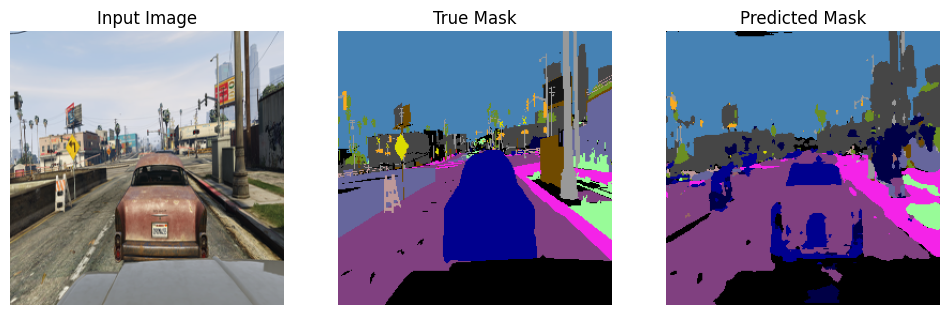

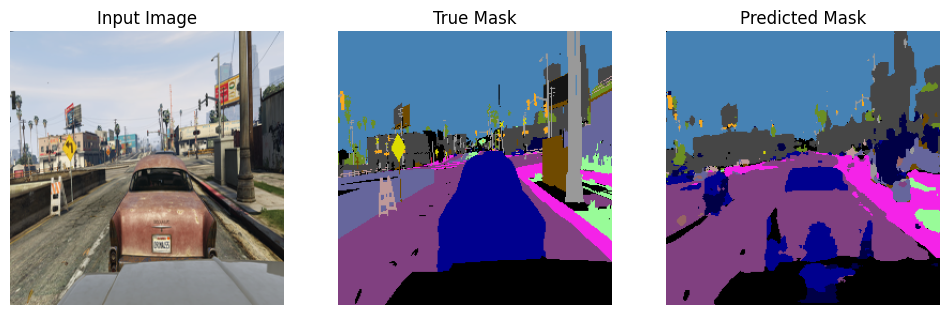

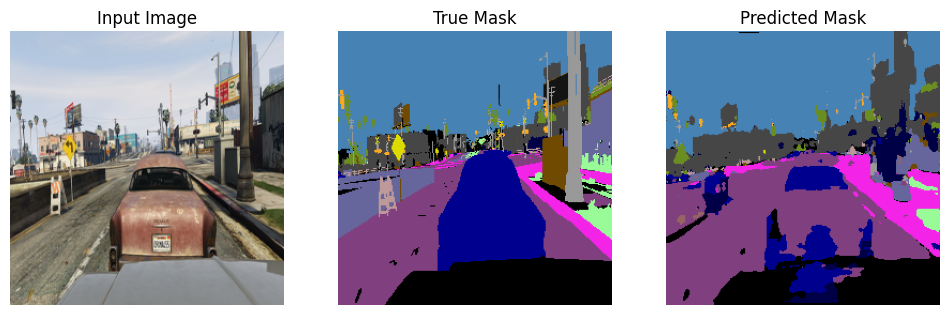

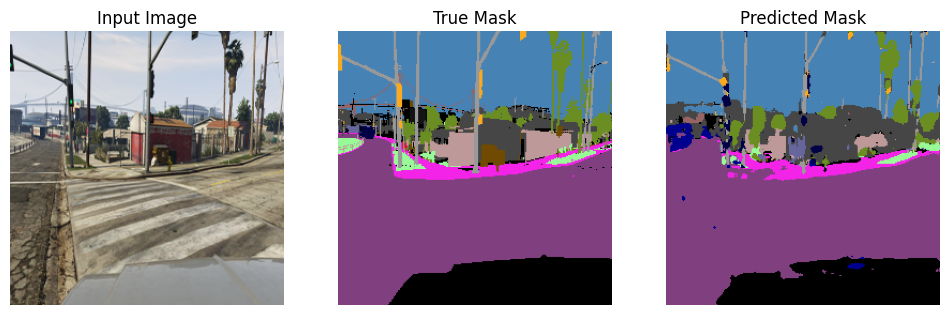

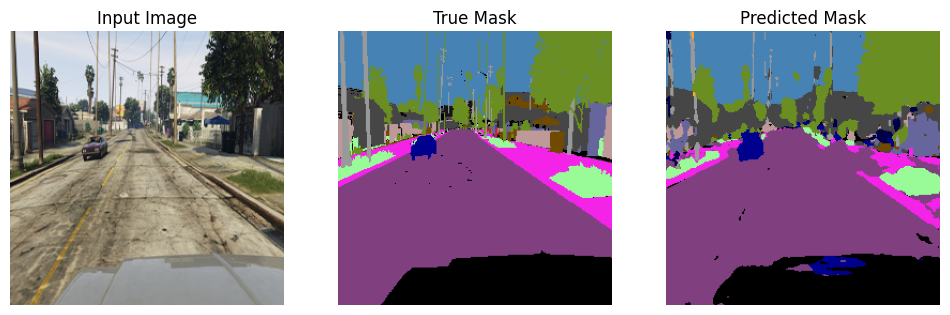

...

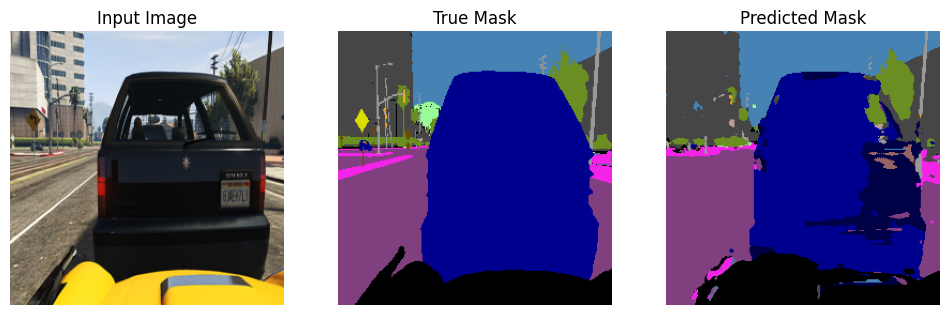

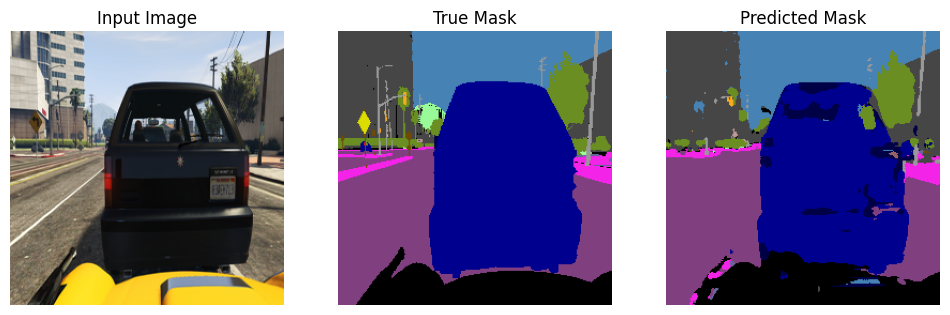

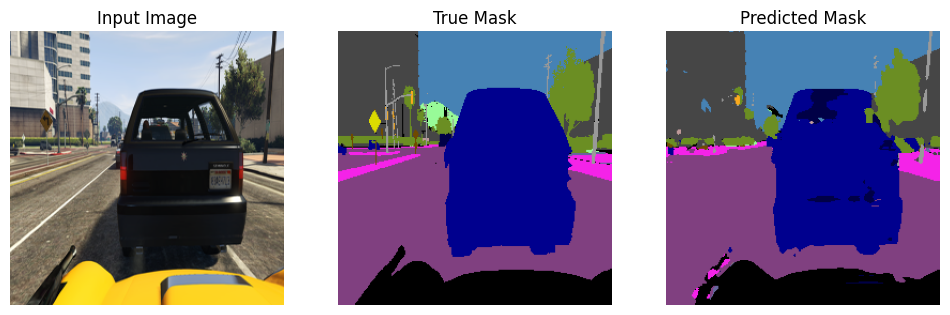

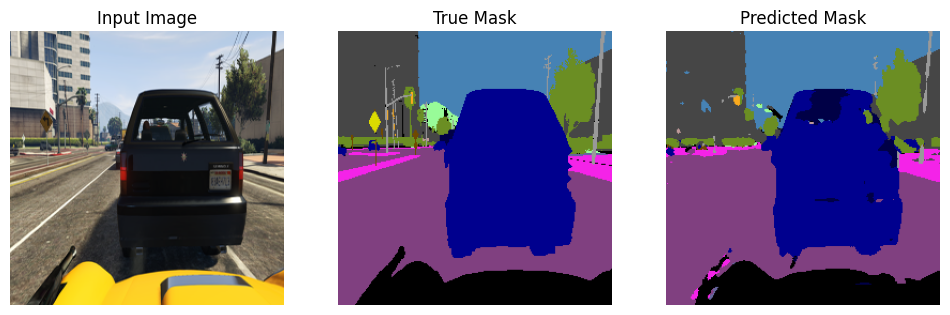

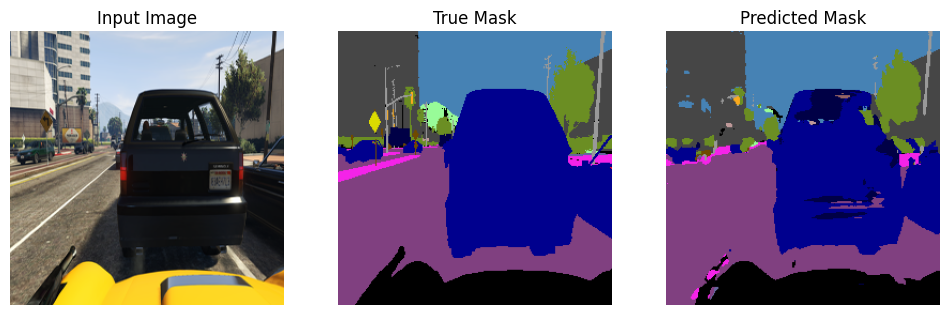

In [13]:
import matplotlib.pyplot as plt
import random
import torch
import numpy as np
# Количество изображений для визуализации
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

with torch.no_grad():
    for i, (image, true_mask) in enumerate(test_loader):
        image = image.to(device)

        output = test_model_with_vgg(image)  # [B, num_classes, H, W]
        pred = torch.argmax(output, dim=1)  # [B, H, W]

        for b in range(image.size(0)):  # цикл по батчу
            pred_mask = pred[b].cpu().numpy()  # (H, W)
            pred_mask_rgb = decode_segmap(pred_mask, class_colors)

            # Обратное преобразование изображения
            img_np = image[b].permute(1, 2, 0).cpu().numpy()
            img_np = (img_np * std) + mean
            img_np = np.clip(img_np, 0, 1)

            true_mask_np = true_mask[b].cpu().numpy()
            true_mask_rgb = decode_segmap(true_mask_np, class_colors)

            plt.figure(figsize=(12, 6))

            plt.subplot(1, 3, 1)
            plt.title("Input Image")
            plt.imshow(img_np)
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.title("True Mask")
            plt.imshow(true_mask_rgb)
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.title("Predicted Mask")
            plt.imshow(pred_mask_rgb)
            plt.axis('off')

            plt.show()

            if i >= 4:  # показать максимум 5 батчей
                break
        if i >= 4:
            break

            break

В ходе работы была использована нейронная сеть UNet, построенная по архитектуре, описанной в методичке. На первоначальной версии модели удалось достичь минимальной потери на валидации около 1.2.

Для повышения качества сегментации была внесена доработка архитектуры: добавлены дополнительные сверточные слои и слои батч-нормализации, а также применены методы аугментации данных.

Эти изменения позволили значительно улучшить результаты модели, обеспечив более точную и стабильную сегментацию изображений.

Вот сравнительные графики по обучению

![Screenshot from 2025-07-14 00-23-49.png](<attachment:Screenshot from 2025-07-14 00-23-49.png>)
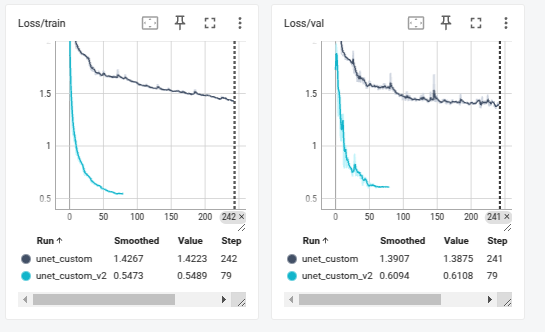

Дополнительно попробовал использовать в качестве энкодера VGG. Это позволило сделать мощный старт за счет уже осмысленных заложенных признаков, а также уменьшить ошибку в итоге.  

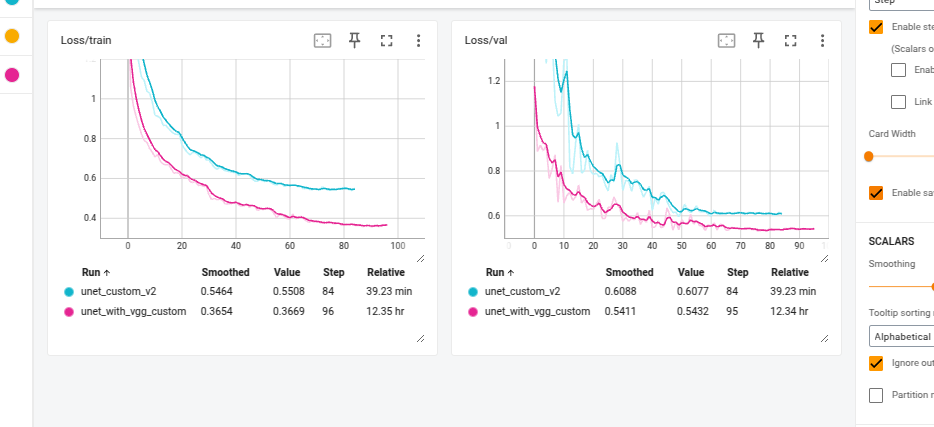